# EDA of the data set


## 1. Load the `.csv` file. 
The `.csv` file is the output of the last notebook.

Take a overview of the data set.

In [1]:
import pandas as pd

In [2]:
df=pd.read_csv("datasets/data_set_iv.csv")

In [3]:
# df[df['SNAP_id']==100]
# df.iloc[9638]['img_link']

In [4]:
df

,img_id,img_link,SNAP_id,v_score,max_a_score,mean_a_score,submissions,max_raw_upvotes,max_number_of_comments
0,10354,http://brie.uchicago.edu/ftp-www/Viral_total/1...,25049,-11.422576,9.5056,5.077835,2,3984,3386
1,9487,http://brie.uchicago.edu/ftp-www/Viral_total/9...,23607,-10.895377,5.7501,5.750100,1,2169,1402
2,1008,http://brie.uchicago.edu/ftp-www/Viral_total/1...,11336,-10.876298,9.0510,4.825350,2,3623,825
3,8086,http://brie.uchicago.edu/ftp-www/Viral_total/8...,21410,-10.512313,8.7481,4.655200,2,4374,964
4,10256,http://brie.uchicago.edu/ftp-www/Viral_total/1...,24876,-10.506665,8.7434,4.670075,2,3213,400
5,15011,http://brie.uchicago.edu/ftp-www/Viral_total/1...,7782,-9.499186,7.9050,4.273360,2,3273,1330
6,12831,http://brie.uchicago.edu/ftp-www/Viral_total/1...,5054,-9.253445,7.7005,4.097750,2,3043,733
7,509,http://brie.uchicago.edu/ftp-www/Viral_total/5...,1066,-8.796331,7.3201,3.802135,2,3263,179
8,10897,http://brie.uchicago.edu/ftp-www/Viral_total/1...,2672,-8.720265,7.2568,3.881060,2,2979,568
9,9959,http://brie.uchicago.edu/ftp-www/Viral_total/9...,24398,-8.306170,6.9122,3.951300,2,3190,2722


Overview of the data set:
- the data has been **sorted** by the virality score(v_score).
- The virality score is calculated according to the strategy of Deza and Parikh.


**Measurement of Virality**

The virality is different with the popularity. The author proposed a fomula to measure the virality.

Let $S_h^n$ be the difference between the number of upvotes and downvotes an image $h$ received at its $n^{th}$ resubmission to a category. (nowadays actually the reddit just show this counts already)

Let $t$ be the time of the resbumission of the image and $c$ be the category (*subreddit*) to which it was submitted. $\overline{S}_{c}^{t}$ is the average score of all submissions to category $c$ at time $t$. 

We define $A_h^n$ to be the ratio of the score of the image $h$ at resubmission $n$ to the average score of all images posted to the category in that hour.

$$A_{h}^{n}=\frac{S_{h}^{n}}{\overline{S}_{c}^{t}}$$

Add an offset to $S_h^n$ so that the smallest score $\min _{h} \min _{n} S_{h}^{n}$ is 0. We define the overall virality score for image $h$ as 

$$V_{h}=\max _{n} A_{h}^{n} \log \left(\frac{m_{h}}{\overline{m}}\right)$$

where $m_h$ is the number of times image $h$ was resubmitted, and $\overline m $ is the average number of times any image has been resubmitted. 

($A_h^n$ measure the popularity and the $V_h$ measure the virality score. The figure 1 showed the images which had the similar $A_h^n$ score but different $V_h$)


**Reference**:

[1]A. Deza and D. Parikh, “Understanding Image Virality,” presented at the Proceedings of the IEEE Conference on Computer Vision and Pattern Recognition, 2015, pp. 1818–1826.

What do the names of the **columns** mean in the dataset?

- v_score: the virality score (main)
- max_a_score/ mean_a_score: the max/mean A score among all the resubmission of the image (each resubmission correspond to one A score)
- submission: the times of submission. 
- max_raw_upvotes: the max number of upvote
- max_number_of_comments: the max number of the comments

In [5]:
import matplotlib.pyplot as plt

virality_score=df['v_score']

<function matplotlib.pyplot.show(*args, **kw)>

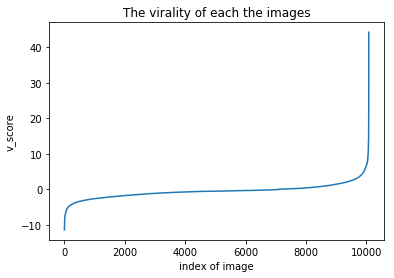

In [7]:
plt.plot(virality_score)
plt.title("The virality of each the images")
plt.xlabel("index of image")
plt.ylabel("v_score")
plt.show

## 2. Check the subreddit 

In [9]:
data_type = {'unixtime': 'Int64', 
             'rawtime': 'str', 
             'title': 'str',
             'total_votes':'Int64',
             'reddit_id': 'str',
             'number_of_upvotes':'Int64',
             'subreddit': 'str',
             'number_of_downvotes':'Int64',
             'localtime':'Int64',
             'score':'Int64',
             'number_of_comments':'Int64',
             'username':'str'}
df_submission = pd.read_csv('datasets/redditSubmissions.csv',
                   error_bad_lines=False,
                  dtype=data_type)

b'Skipping line 67828: expected 13 fields, saw 16\nSkipping line 67829: expected 13 fields, saw 16\nSkipping line 67830: expected 13 fields, saw 16\nSkipping line 67831: expected 13 fields, saw 16\nSkipping line 67832: expected 13 fields, saw 14\n'


In [10]:
df_submission.head()

,#image_id,unixtime,rawtime,title,total_votes,reddit_id,number_of_upvotes,subreddit,number_of_downvotes,localtime,score,number_of_comments,username
0,0,1333172439,2012-03-31T12:40:39.590113-07:00,And here's a downvote.,63470,rmqjs,32657,funny,30813,1333197639,1844,622,Animates_Everything
1,0,1333178161,2012-03-31T14:16:01.093638-07:00,Expectation,35,rmun4,29,GifSound,6,1333203361,23,3,Gangsta_Raper
2,0,1333199913,2012-03-31T20:18:33.192906-07:00,Downvote,41,rna86,32,GifSound,9,1333225113,23,0,Gangsta_Raper
3,0,1333252330,2012-04-01T10:52:10-07:00,Every time I downvote something,10,ro7e4,6,GifSound,4,1333277530,2,0,Gangsta_Raper
4,0,1333272954,2012-04-01T16:35:54.393381-07:00,Downvote &quot;Dies Irae&quot;,65,rooof,57,GifSound,8,1333298154,49,0,Gangsta_Raper


## 3. Build the data set for Siamese Network

To feed into the Siamese network, image pairs should be built. 

There are four ways to build the image pairs(250 image pairs from 500 images):
- 250 images with highest virality score, 250 images with the lowest virality score 
- random image pairs: 
    - 250 highest images with 250 images randomly selected from the lower part
    - 250 images randomly selected from the highest part and 250 least viral images
    - randomly select 250 images from higher part and lower part respectively.
   

In [137]:
pic_len=df.shape[0]
pic_len/2

5039.0

In [47]:
import random 
random.seed(20)
first_half_random=random.sample(range(int(pic_len/2)),250)
second_half_random=random.sample(range(int(pic_len/2),pic_len),250)

In [85]:
df.iloc[:10]['img_id']

0    10354
1     9487
2     1008
3     8086
4    10256
5    15011
6    12831
7      509
8    10897
9     9959
Name: img_id, dtype: int64

Test the `dataset` module

In [129]:
import datasets
from torchvision import transforms

In [124]:
reload(datasets)

<module 'datasets' from '/Users/shuo/Desktop/Image-Virality/datasets.py'>

In [130]:
data=datasets.Reddit_Img_Pair('.',transform=transforms.Compose([
                       transforms.ToTensor(),
                       transforms.Normalize((0.1307,), (0.3081,))
                   ]),re_select=True)

## 4. Build the data set of for subreddit prediction

To do the category prediction task. 

**Multilabel classification**

In [11]:
# we are going to filter the images belonging to these subreddits
subreddit_domain=['funny','WTF','aww','atheism','gaming'

Filter the images and annotate the label

In [195]:
%%time
img_index_annotation_dict={}
for index,content in df.iterrows():
    subreddit_series=df_submission[df_submission['#image_id']==content['SNAP_id']]['subreddit']
    # check the subreddit is in the subreddit_domain
    if subreddit_series.any() in subreddit_domain:
        label=[1 if i in subreddit_series.values else 0 for i in subreddit_domain]
        img_index_annotation_dict[index]= label

CPU times: user 15.4 s, sys: 68 ms, total: 15.5 s
Wall time: 15.5 s


In [196]:
img_index_annotation_dict

{0: [1, 0, 0, 0, 0],
 4: [1, 0, 0, 0, 0],
 5: [1, 0, 0, 0, 0],
 13: [1, 0, 0, 0, 0],
 23: [0, 1, 0, 0, 0],
 24: [0, 0, 1, 0, 0],
 25: [0, 1, 0, 0, 0],
 27: [1, 0, 1, 0, 0],
 28: [1, 0, 0, 0, 0],
 29: [1, 0, 0, 0, 0],
 33: [1, 0, 0, 0, 0],
 36: [1, 0, 0, 0, 0],
 39: [1, 0, 0, 0, 0],
 42: [1, 0, 0, 0, 0],
 43: [1, 0, 0, 0, 0],
 48: [1, 0, 0, 0, 0],
 50: [1, 0, 0, 0, 0],
 51: [1, 0, 0, 0, 0],
 57: [0, 1, 0, 0, 0],
 59: [1, 0, 0, 0, 0],
 60: [1, 0, 0, 0, 0],
 63: [0, 1, 0, 0, 0],
 65: [0, 1, 0, 0, 0],
 68: [0, 1, 0, 0, 0],
 69: [1, 1, 1, 0, 0],
 72: [1, 0, 0, 0, 0],
 73: [1, 0, 0, 0, 0],
 74: [1, 0, 0, 0, 0],
 75: [1, 0, 0, 0, 0],
 77: [1, 0, 0, 0, 0],
 80: [0, 1, 0, 0, 0],
 81: [1, 0, 0, 0, 0],
 82: [1, 0, 0, 0, 0],
 83: [0, 1, 0, 0, 0],
 87: [1, 0, 0, 0, 0],
 89: [1, 0, 0, 0, 0],
 90: [1, 0, 0, 0, 1],
 91: [1, 0, 0, 0, 0],
 95: [1, 0, 0, 0, 0],
 99: [1, 0, 0, 0, 0],
 100: [1, 0, 0, 0, 0],
 106: [1, 0, 0, 0, 0],
 107: [1, 0, 0, 0, 0],
 108: [1, 0, 0, 0, 0],
 110: [1, 0, 0, 0, 0],
 112: [1

In [197]:
print("The index of images which appear in the subreddit domain is: {}...".format(image_index_list[:10]))
# print(image_index_list)  
print("Length: {}".format(len(image_index_list)))

The index of images which appear in the subreddit domain is: [0, 4, 5, 13, 23, 24, 25, 27, 28, 29]...
Length: 5656


It seems that there is inbalance in the data set.
By summing them up, to check the number of each subreddit.

In [201]:
a=np.zeros(5)
for i in img_index_annotation_dict.values():
    a=a+i
print(a)

[4794. 1554.  532.  440.  436.]


the data set is imbalance. A lot of images are from the funny subreddit. 


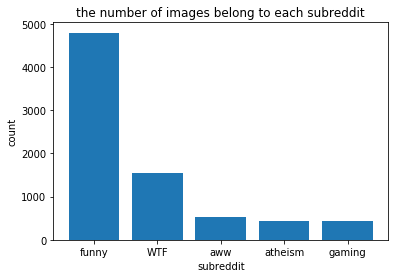

In [207]:
plt.bar(subreddit_domain,a)
plt.title("the number of images belong to each subreddit")
plt.xlabel("subreddit")
plt.ylabel("count")

print("the data set is imbalance. A lot of images are from the funny subreddit. ")

Let's get the images out of the `df`

In [236]:
from tqdm import tqdm

In [240]:
%%time
df_subreddit_index=[i for i in img_index_annotation_dict.keys()]
df_subreddit=df.iloc[df_subreddit_index].copy().reset_index(drop=True)
# for index,content in tqdm(df_subreddit.iterrows()):
#     df_subreddit.loc[index][label]=img_index_annotation_dict[index]
df_subreddit

CPU times: user 2.83 ms, sys: 603 µs, total: 3.44 ms
Wall time: 3.17 ms


In [266]:
# add the label column
label=[i for i in img_index_annotation_dict.values()]
df_subreddit['label']=list(label)

In [272]:
df_subreddit[['img_id','label']].to_csv("datasets/img_label_for_classification.csv",index=False)

In [261]:
# type(df_subreddit['label'][0])
# df_subreddit

**multi class classification**

Single label for each data

How to decide the subreddit:
- number of the resubmission on that category $m_c$
- $S_h^c$ the difference between the upvotes and downvotes the image $h$ receive in the subreddit $c$ at a single submission.

Here I define the $V_h^c= \frac{m_c}{\overline m} \frac{S_h^c}{\overline S_h^c}$ as the measurement for the virality in a certain subreddit.

In [296]:
# the list of the filtered images
# image_index_list

# len(df_subreddit['SNAP_id'])
# df_sub=df_subreddit.drop(columns=['label'])

Filter the images content from the `df_submission`

In [310]:
%%time
filter_list=df_subreddit['SNAP_id']
list_images_filtered=[]
for index,content in df_submission.iterrows():
    if content["#image_id"] in filter_list.values:
        list_images_filtered.append(index)
#         print(type(content["#image_id"]))

CPU times: user 10.5 s, sys: 50.9 ms, total: 10.6 s
Wall time: 10.6 s


In [312]:
len(list_images_filtered)

38173

In [316]:
df_sub=df_submission.iloc[list_images_filtered].copy().reset_index(drop=True)

In [408]:
df_sub

,#image_id,unixtime,rawtime,title,total_votes,reddit_id,number_of_upvotes,subreddit,number_of_downvotes,localtime,score,number_of_comments,username,mean_score,m_subreddit,mean_m
0,100,1358858328,2013-01-22T12:38:48+00:00,Included in the informational packet given to ...,8,171vu0,5,funny,3,1358858328,2,0,Sarbanes_Foxy,153.076923,11,9.615385
1,100,1358871815,2013-01-22T16:23:35+00:00,how people tend to sing the national anthem at...,10,17272u,7,pics,3,1358871815,4,3,awcreative,153.076923,2,9.615385
2,100,1358873901,2013-01-22T16:58:21+00:00,Star Spangled Banner - Sporting Event Version,5,1729gb,4,funny,1,1358873901,3,0,potato1,153.076923,11,9.615385
3,100,1358874067,2013-01-22T17:01:07+00:00,How to sing the national anthem at a sporting ...,15104,1729nd,8548,funny,6556,1358874067,1992,352,watcher_of_the_skies,153.076923,11,9.615385
4,100,1358880415,2013-01-22T18:46:55+00:00,Star Spangled Banner - Sporting Event Edition,13,172htq,8,funny,5,1358880415,3,0,tianan,153.076923,11,9.615385
5,100,1358882437,2013-01-22T19:20:37+00:00,Star Spangled Banner: Sporting Event Version,19,172ki8,11,funny,8,1358882437,3,2,NaN,153.076923,11,9.615385
6,100,1358893345,2013-01-22T22:22:25+00:00,Star Spangled Banner - Sporting Event Version,13,172zeg,8,funny,5,1358893345,3,0,Spam4119,153.076923,11,9.615385
7,100,1358895795,2013-01-22T23:03:15+00:00,How the American national anthem is generally ...,6,1732pc,3,pics,3,1358895795,0,2,NaN,153.076923,2,9.615385
8,100,1358898147,2013-01-22T23:42:27+00:00,As painfully slow as possible.,12,1735pk,5,funny,7,1358898147,-2,0,NaN,153.076923,11,9.615385
9,100,1358899057,2013-01-22T23:57:37+00:00,How to sing the Star Spangled Banner,9,1736um,2,funny,7,1358899057,-5,0,beardface909,153.076923,11,9.615385


Add the mean score into the `df_sub`.

In [328]:
df_img_score_aver=df_sub[['#image_id','score']].groupby(['#image_id']).mean()

In [383]:
# df_img_score_aver['score']   # series items. to iterate the (index,items)
# df_img_score_aver['score'].at[5]  # use the .at to retrive the value by a given key

In [348]:
mean_score_list=[]
for index,content in df_sub.iterrows():
    mean_score=df_img_score_aver['score'].at[content['#image_id']]
    mean_score_list.append(mean_score)
df_sub['mean_score']=mean_score_list

In [355]:
# df_sub

Count the number of resubmission on each category

In [362]:
occurrence_of_subreddit = df_sub[['#image_id','subreddit']].groupby(['#image_id','subreddit']).size()

In [386]:
occurrence_of_subreddit[2]

subreddit
AdviceAnimals    5
funny            4
pics             1
trees            1
dtype: int64

In [387]:
occurence_sub=[]
for index,content in df_sub.iterrows():
    img_id=content['#image_id']
    subreddit_id=content['subreddit']
    occurence_sub.append(occurrence_of_subreddit[img_id][subreddit_id])
df_sub['m_subreddit']=occurence_sub

Calculate the `mean_m` value

In [395]:
mean_m_groupbyId=df_sub[['#image_id','m_subreddit']].groupby(['#image_id']).mean()

In [404]:
# mean_m_groupbyId['m_subreddit']

In [405]:
m_mean_list=[]
for index,content in df_sub.iterrows():
    img_id=content['#image_id']
    m_mean_i=mean_m_groupbyId['m_subreddit'][img_id]
    m_mean_list.append(m_mean_i)
df_sub['mean_m']=m_mean_list

Calculate the virality of an image for one subreddit

In [412]:
df_sub

,#image_id,unixtime,rawtime,title,total_votes,reddit_id,number_of_upvotes,subreddit,number_of_downvotes,localtime,score,number_of_comments,username,mean_score,m_subreddit,mean_m,virality_subreddit
0,100,1358858328,2013-01-22T12:38:48+00:00,Included in the informational packet given to ...,8,171vu0,5,funny,3,1358858328,2,0,Sarbanes_Foxy,153.076923,11,9.615385,0.014947
1,100,1358871815,2013-01-22T16:23:35+00:00,how people tend to sing the national anthem at...,10,17272u,7,pics,3,1358871815,4,3,awcreative,153.076923,2,9.615385,0.005435
2,100,1358873901,2013-01-22T16:58:21+00:00,Star Spangled Banner - Sporting Event Version,5,1729gb,4,funny,1,1358873901,3,0,potato1,153.076923,11,9.615385,0.022420
3,100,1358874067,2013-01-22T17:01:07+00:00,How to sing the national anthem at a sporting ...,15104,1729nd,8548,funny,6556,1358874067,1992,352,watcher_of_the_skies,153.076923,11,9.615385,14.886947
4,100,1358880415,2013-01-22T18:46:55+00:00,Star Spangled Banner - Sporting Event Edition,13,172htq,8,funny,5,1358880415,3,0,tianan,153.076923,11,9.615385,0.022420
5,100,1358882437,2013-01-22T19:20:37+00:00,Star Spangled Banner: Sporting Event Version,19,172ki8,11,funny,8,1358882437,3,2,NaN,153.076923,11,9.615385,0.022420
6,100,1358893345,2013-01-22T22:22:25+00:00,Star Spangled Banner - Sporting Event Version,13,172zeg,8,funny,5,1358893345,3,0,Spam4119,153.076923,11,9.615385,0.022420
7,100,1358895795,2013-01-22T23:03:15+00:00,How the American national anthem is generally ...,6,1732pc,3,pics,3,1358895795,0,2,NaN,153.076923,2,9.615385,0.000000
8,100,1358898147,2013-01-22T23:42:27+00:00,As painfully slow as possible.,12,1735pk,5,funny,7,1358898147,-2,0,NaN,153.076923,11,9.615385,-0.014947
9,100,1358899057,2013-01-22T23:57:37+00:00,How to sing the Star Spangled Banner,9,1736um,2,funny,7,1358899057,-5,0,beardface909,153.076923,11,9.615385,-0.037367


In [411]:
df_sub['virality_subreddit']=(df_sub['score']/df_sub['mean_score'])*(df_sub['m_subreddit']/df_sub['mean_m'])

Find the most suitable subreddit of image

In [415]:
groupby_max_virality_series=df_sub[['#image_id','subreddit','virality_subreddit']].groupby(['#image_id']).max()

In [427]:
groupby_max_virality_series['subreddit']

#image_id
2                  trees
5                   pics
7                   pics
11                 funny
14                gaming
21                  pics
24                  pics
26                  pics
35                  pics
40               toosoon
44                  pics
49                  pics
55                  pics
56                 funny
60                 funny
61                  pics
63                 funny
73                 funny
78                  pics
82                 funny
83       minerapocalypse
92                  pics
94                 funny
100                 pics
101                funny
103                funny
109              atheism
114                funny
115                  WTF
118                 pics
              ...       
25722              funny
25725              funny
25726              funny
25755              funny
25756               pics
25762              funny
25769               rage
25770              funny
25777          

In [420]:
groupby_max_virality_series['subreddit'].value_counts()  # to show the final subreddit for each image

# to see the distribution of these images' subreddit

funny                   2494
pics                    2057
gaming                   287
WTF                      172
aww                      117
atheism                  105
trees                     64
reddit.com                53
pokemon                   19
photoshopbattles          16
vertical                  12
gifs                      10
toosoon                    8
zelda                      7
wallpaper                  7
wallpapers                 7
proper                     6
techsupportgore            5
lolcats                    5
lotr                       5
unitedkingdom              5
tall                       4
thewalkingdead             4
offbeat                    4
harrypotter                4
youtubecomments            4
lol                        4
southpark                  4
nostalgia                  3
zombies                    3
                        ... 
motorcycles                1
thingstomakeyoudrool       1
subaru                     1
lgbt          

Build the data set and output to the file

You should also filter the images which are not from the domain

In [423]:
# we are going to filter the images belonging to these subreddits
subreddit_domain=['funny','WTF','aww','atheism','gaming']
subreddit_domain_dict={'funny':0,'WTF':1,'aww':2,'atheism':3,'gaming':4}

In [459]:
img_id_list=df_sub['#image_id'].unique()

In [430]:
subreddit_list=[]
# subreddit_index_list=[]
for i in img_id_list:
    subreddit_i=groupby_max_virality_series['subreddit'][i]
    subreddit_list.append(subreddit_i)
#     subreddit_index_list.append(subreddit_domain_dict[subreddit_i])

In [431]:
df_final_classification=pd.DataFrame(data={'img_id':img_id_list,'subreddit':subreddit_list})

Filter the images which are not from the domain

In [434]:
keep_index=[]
for index,content in df_final_classification.iterrows():
    if content['subreddit'] in subreddit_domain:
        keep_index.append(index)

In [439]:
df_final_classification=df_final_classification.iloc[keep_index]

In [442]:
label_list=[]
for index,content in df_final_classification.iterrows():
    label_i=subreddit_domain_dict[content['subreddit']]
    label_list.append(label_i)
df_final_classification['label']=label_list

/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """


In [490]:
# df_final_classification=df_final_classification[['img_id','SNAP_id','subreddit','label']]
df_final_classification

,img_id,SNAP_id,subreddit,label
1,8,10004,funny,0
4,20,10017,gaming,4
5,21,10018,funny,0
7,34,10035,funny,0
11,49,10051,funny,0
12,51,10054,funny,0
15,57,10061,funny,0
16,60,10067,funny,0
17,61,10069,funny,0
18,62,10070,funny,0


In [482]:
# convert the SNAP_id to the image id (image name)
# df_final_classification['SNAP_id']=df_final_classification['img_id']
id_list=[]
for index,content in df_final_classification.iterrows():
    snap_id=content['SNAP_id']
    img_id=df[df['SNAP_id']==snap_id]['img_id'].values[0]
    id_list.append(img_id)
df_final_classification['img_id']=id_list

In [491]:
df_final_classification.to_csv('datasets/image4classification.csv',index=False)

In [492]:
df_final_classification['label'].value_counts()

0    2494
4     287
1     172
2     117
3     105
Name: label, dtype: int64

I'm going to randomly select 100 images from each subreddit.

In [455]:
# randomly show ten images for each subreddit.
import visualisation
from PIL import Image
from torchvision import transforms

In [456]:
def select_10_images(name_subreddit):
    name_list=df_final_classification[df_final_classification['subreddit']==name_subreddit]['img_id'][:10]
    return name_list

def read_images(name_list):
    images_list=[]
    for name in name_list:
        img=Image.open('./images/'+str(name)+'.jpg')
        images_list.append(transforms.functional.to_tensor(img))
    return images_list

In [499]:
def show_images(images, cols = 1, titles = None):
    """Display a list of images in a single figure with matplotlib.
    
    Parameters
    ---------
    images: List of tensors C H W
    
    cols (Default = 1): Number of columns in figure (number of rows is 
                        set to np.ceil(n_images/float(cols))).
    
    titles: List of titles corresponding to each image. Must have
            the same length as titles.
    """
    assert((titles is None)or (len(images) == len(titles)))
    n_images = len(images)
    if titles is None: titles = ['Image (%d)' % i for i in range(1,n_images + 1)]
    fig = plt.figure()
    for n, (image, title) in enumerate(zip(images, titles)):
        a = fig.add_subplot(cols, np.ceil(n_images/float(cols)), n + 1)
        if image.size()[0] == 2:
            plt.gray()
        plt.imshow(image.permute(1, 2, 0))
        a.set_title(title)
    fig.set_size_inches(np.array(fig.get_size_inches()) * n_images)
    plt.show()

subreddit_domain: ['funny','WTF','aww','atheism','gaming']

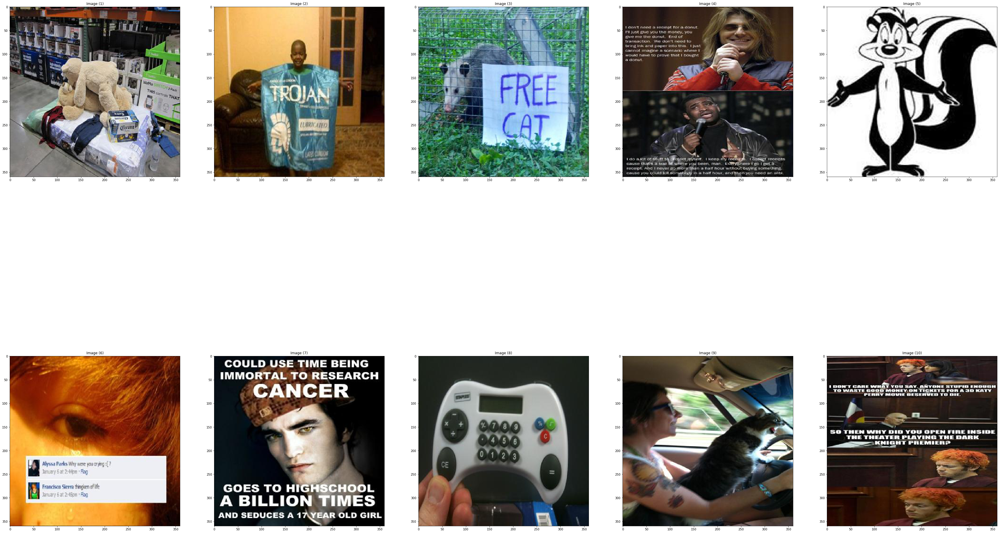

In [501]:
show_images(read_images(select_10_images('funny')),cols=2)

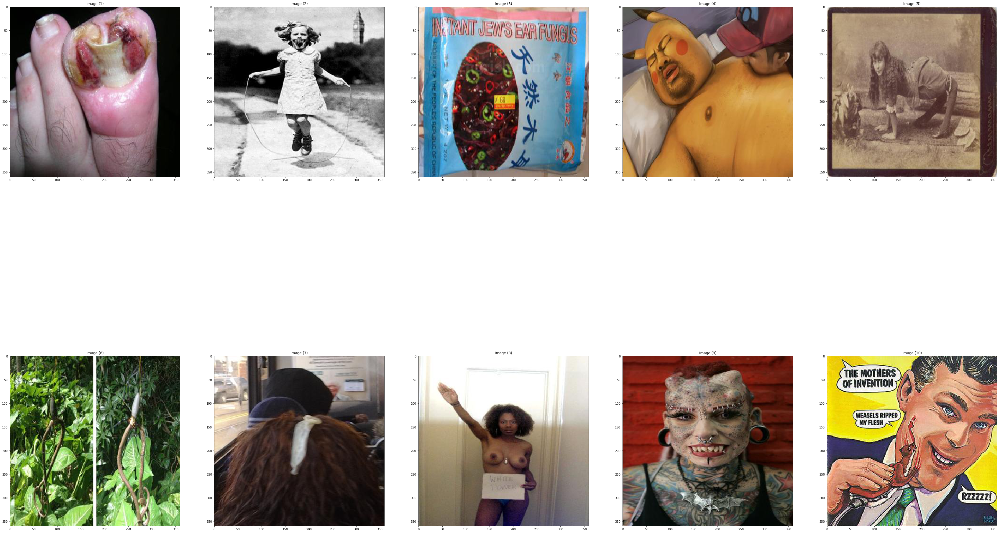

In [502]:
show_images(read_images(select_10_images('WTF')),cols=2)

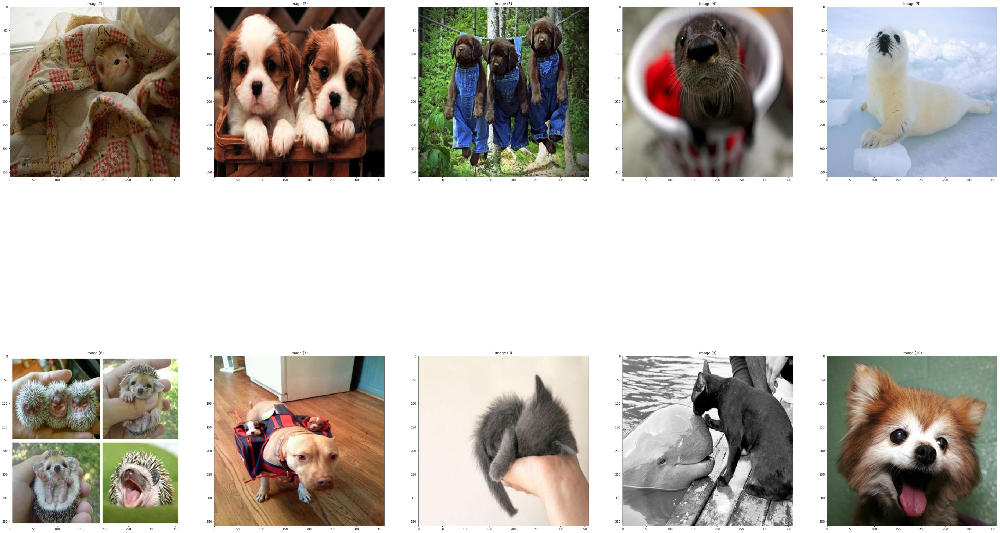

In [503]:
show_images(read_images(select_10_images('aww')),cols=2)

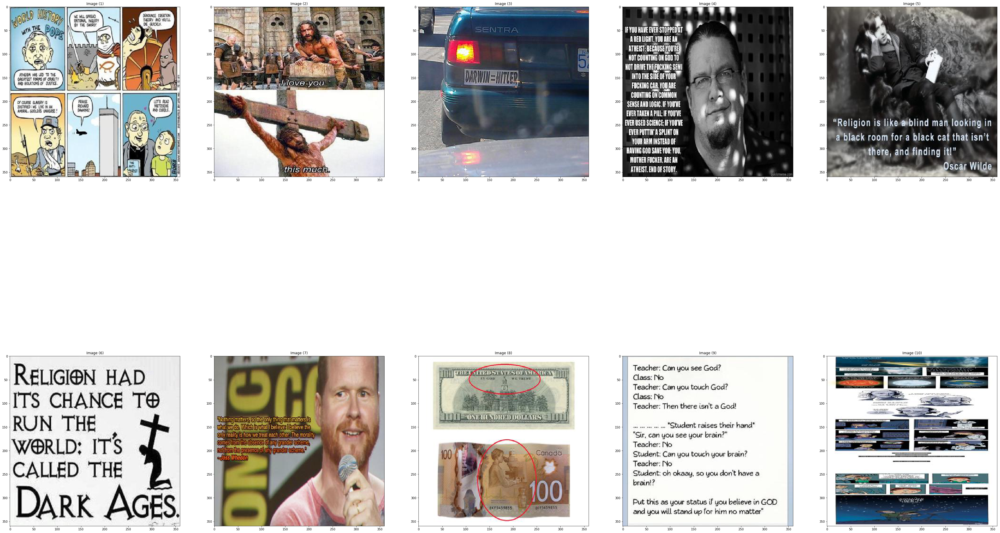

In [504]:
show_images(read_images(select_10_images('atheism')),cols=2)

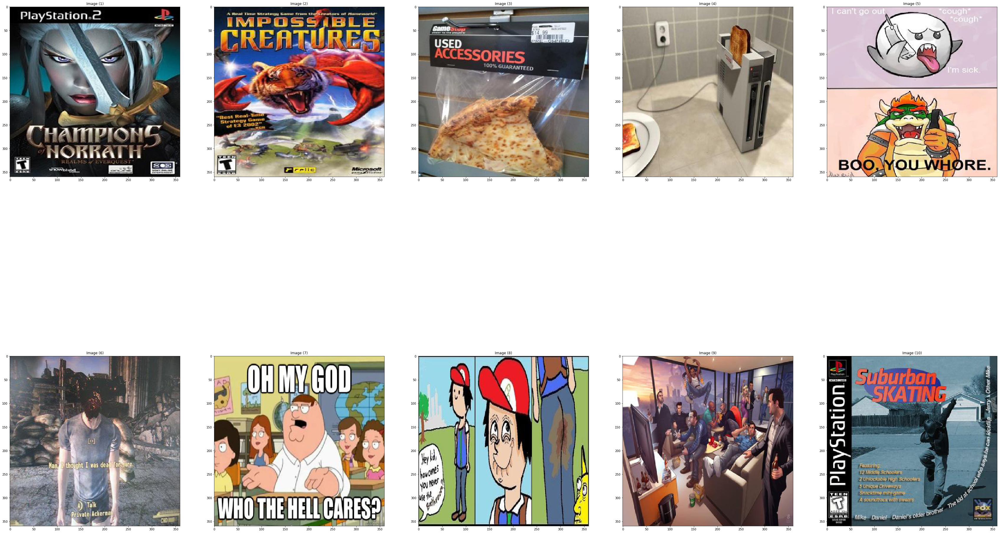

In [506]:
show_images(read_images(select_10_images('gaming')),cols=2)